# Exploring Evictions and Code Violations in Philadelphia

Third Assignment of MUSA 620 Data Wrangling and Data Visualization of University of Pennsylvania.



We'll explore spatial trends evictions in Philadelphia using data from the [Eviction Lab](https://evictionlab.org/) and building code violations using data from [OpenDataPhilly](https://www.opendataphilly.org/).

And we'll be exploring the idea that evictions can occur as retaliation against renters for reporting code violations. Spatial correlations between evictions and code violations from the City's Licenses and Inspections department can offer some insight into this question. 

## 1. Explore Eviction Lab Data


### 1.1 Read data using `geopandas`

The first step is to read the eviction data by census tract using `geopandas`. The data for all of Pennsylvania by census tract is downloaded in a GeoJSON format using the following url:

https://eviction-lab-data-downloads.s3.amazonaws.com/PA/tracts.geojson

In [1]:
import pandas as pd
import geopandas as gpd
import hvplot.pandas
import cartopy.crs as ccrs
from pyrestcli.auth import NoAuthClient
from carto.sql import SQLClient
from matplotlib import pyplot as plt

%matplotlib inline

In [2]:
url = 'https://eviction-lab-data-downloads.s3.amazonaws.com/PA/tracts.geojson'
df = gpd.read_file(url, crs={'init': 'epsg:4326'})

In [3]:
df.head(3)

,GEOID,west,south,east,north,n,pl,p-00,pr-00,roh-00,...,pm-16,po-16,ef-16,e-16,er-16,efr-16,lf-16,imputed-16,subbed-16,geometry
0,42003412002,-80.1243,40.5422,-80.0640,40.5890,4120.02,"Allegheny County, Pennsylvania",4748.59,0.88,58.0,...,0.00,0.0,0.0,0.0,0.00,0.00,1.0,0.0,1.0,"(POLYGON ((-80.06670099999999 40.584012, -80.0..."
1,42003413100,-80.0681,40.5850,-79.9906,40.6143,4131,"Allegheny County, Pennsylvania",6771.01,3.47,729.0,...,1.59,0.0,12.0,2.0,0.27,1.62,1.0,0.0,1.0,"(POLYGON ((-80.068057 40.612536, -80.054520999..."
2,42003413300,-80.0657,40.5527,-80.0210,40.5721,4133,"Allegheny County, Pennsylvania",5044.59,2.99,119.0,...,0.95,0.0,4.0,1.0,0.49,1.96,1.0,0.0,1.0,"(POLYGON ((-80.03821600000001 40.553495, -80.0..."


### 1.2 Explore and trim the data 

We will need to trim data to Philadelphia only

In [4]:
phila = df[df['pl'] == 'Philadelphia County, Pennsylvania'].reset_index(drop = True)

In [5]:
phila.head(3)

,GEOID,west,south,east,north,n,pl,p-00,pr-00,roh-00,...,pm-16,po-16,ef-16,e-16,er-16,efr-16,lf-16,imputed-16,subbed-16,geometry
0,42101000100,-75.1523,39.9481,-75.1415,39.9569,1,"Philadelphia County, Pennsylvania",2646.71,9.26,1347.0,...,2.49,0.0,25.0,16.0,0.93,1.45,0.0,0.0,1.0,"(POLYGON ((-75.14160699999999 39.955491, -75.1..."
1,42101000200,-75.1631,39.9529,-75.1511,39.9578,2,"Philadelphia County, Pennsylvania",1362.00,56.42,374.0,...,2.27,0.0,11.0,8.0,0.95,1.30,0.0,0.0,1.0,"(POLYGON ((-75.151223 39.956862, -75.151669 39..."
2,42101000300,-75.1798,39.9544,-75.1623,39.9599,3,"Philadelphia County, Pennsylvania",2570.00,12.16,861.0,...,1.76,0.0,26.0,14.0,0.73,1.35,0.0,0.0,1.0,"(POLYGON ((-75.162339 39.957825, -75.162374 39..."


### 1.3 Transform from wide to tidy format

In [6]:
phila_tidy = pd.melt(phila, id_vars = ['GEOID', 'geometry'], 
                     value_vars = ['e-{:02d}'.format(x) for x in range(3, 17)],
                    var_name = 'eviction_year', value_name = 'count')

In [7]:
phila_tidy.head()

,GEOID,geometry,eviction_year,count
0,42101000100,"(POLYGON ((-75.14160699999999 39.955491, -75.1...",e-03,21.0
1,42101000200,"(POLYGON ((-75.151223 39.956862, -75.151669 39...",e-03,3.0
2,42101000300,"(POLYGON ((-75.162339 39.957825, -75.162374 39...",e-03,17.0
3,42101000801,"(POLYGON ((-75.177323 39.950964, -75.177843 39...",e-03,13.0
4,42101000804,"(POLYGON ((-75.17118000000001 39.947784, -75.1...",e-03,21.0


### 1.4 Plot the total number of evictions per year from 2003 to 2016

In [8]:
phila_tidy['year'] = phila_tidy['eviction_year'].apply(lambda x : '20' + x[2:])

In [9]:
by_year = phila_tidy.groupby('year')['count'].sum().reset_index()

In [10]:
by_year

,year,count
0,2003,10647.0
1,2004,10491.0
2,2005,10550.0
3,2006,11078.0
4,2007,11032.0
5,2008,10866.0
6,2009,9821.0
7,2010,10628.0
8,2011,10882.0
9,2012,11130.0


In [11]:
by_year.hvplot(x = 'year', y = 'count', kind = 'line')

:Curve   [year]   (count)

### 1.5 The number of evictions across Philadelphia

In [12]:
phila_tidy = gpd.GeoDataFrame(phila_tidy, geometry='geometry', 
                            crs={'init':'epsg:4326'})

In [13]:
phila_tidy = phila_tidy.to_crs(epsg=3857)

In [14]:
phila_tidy.crs

{'init': 'epsg:3857', 'no_defs': True}

In [15]:
phila_tidy.hvplot(c='count', crs = 3857, groupby = 'eviction_year', dynamic = False, width=500, height=400)

:HoloMap   [eviction_year]
   :Polygons   [Longitude,Latitude]   (GEOID,eviction_year,count,year)

## 2. Code Violations in Philadelphia

Next, we'll explore data for code violations from the Licenses and Inspections Department of Philadelphia to look for potential correlations with the number of evictions.

We'll be pulling data directly from the CARTO database for the [L&I Violations dataset](https://www.opendataphilly.org/dataset/licenses-and-inspections-violations).

### 2.1 Count the number of rows in the database

First, use the `carto` package to query the database and count the total number of rows.

In [16]:
API_endpoint = "https://phl.carto.com"
sql_client = SQLClient(NoAuthClient(API_endpoint))

In [17]:
query = "SELECT COUNT(*) FROM li_violations"
response = sql_client.send(query)

C:\Users\MaiRZ\Anaconda3\envs\musa\lib\site-packages\pyrestcli\auth.py:79: UserWarning: You are using methods other than get with no authentication!!!
  warnings.warn(_("You are using methods other than get with no authentication!!!"))


In [18]:
print('There are', response['rows'][0]['count'], 'rows in the database.')

There are 1330213 rows in the database.


### 2.2 Get a single row of data for column inspection


In [19]:
query = '''
SELECT * FROM li_violations
LIMIT 1
'''

features = sql_client.send(query, format='geojson')

In [20]:
features

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'geometry': {'type': 'Point', 'coordinates': [-75.174598, 39.991679]},
   'properties': {'cartodb_id': 1,
    'objectid': 49,
    'addresskey': '629364',
    'opa_account_num': '281243200',
    'address': '2540 W YORK ST',
    'unit': '',
    'zip': '19132-4235',
    'censustract': '169',
    'council_district': '5',
    'ownername': 'HOME OPPORTUNITY LLC',
    'organization': '',
    'casenumber': '440144',
    'aptype': 'CD ENFORCE',
    'caseaddeddate': '2014-07-01T15:43:49Z',
    'caseresolutiondate': '2016-07-20T08:37:14Z',
    'caseresolutioncode': 'REISS',
    'apfailkey': 3594910,
    'violationdate': '2014-07-01T00:00:00Z',
    'violationtype': 'PM-102.4/2',
    'violationdescription': 'LICENSE-VAC RES BLDG',
    'mostrecentinsp': '2015-06-26T07:42:43Z',
    'status': 'COMPLIED',
    'casestatus': 'CLOSED',
    'casegroup': 'HCEU',
    'casepriority': 'NH',
    'prioritydesc': 'NON HAZARDOUS',
    'geocode_x': 

In [21]:
df = gpd.GeoDataFrame.from_features(features, crs={'init':'epsg:4326'})

In [22]:
df

,address,addresskey,apfailkey,aptype,cartodb_id,caseaddeddate,casegroup,casenumber,casepriority,caseresolutioncode,...,opa_account_num,organization,ownername,prioritydesc,status,unit,violationdate,violationdescription,violationtype,zip
0,2540 W YORK ST,629364,3594910,CD ENFORCE,1,2014-07-01T15:43:49Z,HCEU,440144,NH,REISS,...,281243200,,HOME OPPORTUNITY LLC,NON HAZARDOUS,COMPLIED,,2014-07-01T00:00:00Z,LICENSE-VAC RES BLDG,PM-102.4/2,19132-4235


In [23]:
print('The column that gives the date of each code violation is called "violationdate", \
and the violation date of the first row is', df.loc[0, 'violationdate'])

The column that gives the date of each code violation is called "violationdate", and the violation date of the first row is 2014-07-01T00:00:00Z


### 2.3 Get the data from 2012 to 2016


In [24]:
query = '''
SELECT * FROM li_violations
WHERE violationdate BETWEEN '2012-01-01T00:00:00Z' AND '2016-12-31T23:59:59Z'
'''

features = sql_client.send(query, format='geojson')

In [25]:
df1 = gpd.GeoDataFrame.from_features(features, crs={'init':'epsg:4326'})

### 2.4 Remove any violations with missing locations


In [26]:
df1 = df1[df1['geometry'].notnull()]

### 2.5 Trim to specific violation types

Below, 15 types of violations that deal with property maintenance and licensing issues are selected. We'll focus on these violations. The goal is to see if these kinds of violations are correlated spatially with the number of evictions in a given area. 

In [27]:
violation_types = ['INT-PLMBG MAINT FIXTURES-RES',
 'INT S-CEILING REPAIR/MAINT SAN',
 'PLUMBING SYSTEMS-GENERAL',
 'CO DETECTOR NEEDED',
 'INTERIOR SURFACES',
 'EXT S-ROOF REPAIR',
 'ELEC-RECEPTABLE DEFECTIVE-RES',
 'INT S-FLOOR REPAIR',
 'DRAINAGE-MAIN DRAIN REPAIR-RES',
 'DRAINAGE-DOWNSPOUT REPR/REPLC',
 'LIGHT FIXTURE DEFECTIVE-RES',
 'LICENSE-RES SFD/2FD',
 'ELECTRICAL -HAZARD',
 'VACANT PROPERTIES-GENERAL',
 'INT-PLMBG FIXTURES-RES']

In [28]:
df1 = df1[df1['violationdescription'].isin(violation_types)]

### 2.6 Make a hex bin map


In [29]:
df1 = df1.to_crs(epsg = 3857)

phila = phila.to_crs(epsg = 3857)

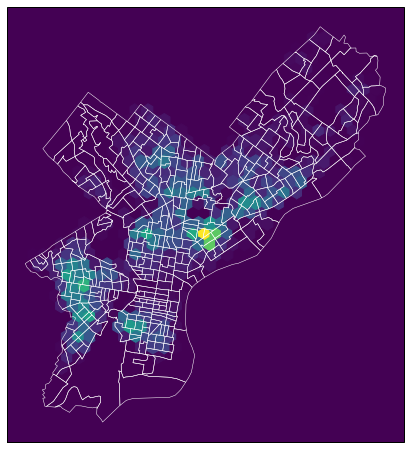

In [30]:
ax = plt.axes(projection=ccrs.epsg('3857'))

ax.hexbin(df1.geometry.x, df1.geometry.y, gridsize=30, mincnt=1, cmap='viridis')

phila.plot(ax=ax, facecolor='none', linewidth=0.5, edgecolor='white')

ax.outline_patch.set_facecolor(plt.get_cmap('viridis')(0))
ax.outline_patch.set_zorder(0)

ax.figure.set_size_inches((8, 8))

### 2.7 Spatially join data sets


In [31]:
phila_tracts = phila.loc[:, ['geometry', 'GEOID']]
violation = df1.loc[:, ['geometry', 'violationdate', 'violationdescription', 'violationtype', 'zip']]

In [32]:
joined = gpd.sjoin(violation, phila_tracts, op='within', how='left')

In [33]:
joined.head()

,geometry,violationdate,violationdescription,violationtype,zip,index_right,GEOID
1,POINT (-8363151.704986936 4871083.338119383),2013-02-12T00:00:00Z,INT-PLMBG FIXTURES-RES,PM-405.3/1,19120-2822,368,42101027402
19,POINT (-8374465.327475239 4860417.837250185),2012-09-17T00:00:00Z,LICENSE-RES SFD/2FD,PM-102.3/1,19139-2539,235,42101009400
31,POINT (-8363211.706192475 4870786.741624864),2015-06-17T00:00:00Z,ELEC-RECEPTABLE DEFECTIVE-RES,PM-407.2/9,19120-2811,368,42101027402
33,POINT (-8346546.510503776 4879574.413430033),2016-09-02T00:00:00Z,CO DETECTOR NEEDED,FC-908.7/1,19154-2907,40,42101036302
40,POINT (-8364658.859572787 4865752.932900787),2016-12-27T00:00:00Z,PLUMBING SYSTEMS-GENERAL,PM15-504.1,19133-2812,375,42101017500


### 2.8 Calculate the number of violations by type per census tract

In [34]:
tract_with_type = joined.groupby(['GEOID', 'violationdescription']).size().\
unstack(fill_value=0).stack().reset_index(name='count')

In [35]:
tract_with_type.head()

,GEOID,violationdescription,count
0,42101000100,CO DETECTOR NEEDED,0
1,42101000100,DRAINAGE-DOWNSPOUT REPR/REPLC,6
2,42101000100,DRAINAGE-MAIN DRAIN REPAIR-RES,0
3,42101000100,ELEC-RECEPTABLE DEFECTIVE-RES,0
4,42101000100,ELECTRICAL -HAZARD,2


### 2.9 Merge with census tracts geometries

In [36]:
tract_with_type = pd.merge(phila_tracts, tract_with_type, left_on = 'GEOID', right_on = 'GEOID')

In [37]:
tract_with_type.head(16)

,geometry,GEOID,violationdescription,count
0,(POLYGON ((-8364725.428628281 4859476.45937238...,42101000100,CO DETECTOR NEEDED,0
1,(POLYGON ((-8364725.428628281 4859476.45937238...,42101000100,DRAINAGE-DOWNSPOUT REPR/REPLC,6
2,(POLYGON ((-8364725.428628281 4859476.45937238...,42101000100,DRAINAGE-MAIN DRAIN REPAIR-RES,0
3,(POLYGON ((-8364725.428628281 4859476.45937238...,42101000100,ELEC-RECEPTABLE DEFECTIVE-RES,0
4,(POLYGON ((-8364725.428628281 4859476.45937238...,42101000100,ELECTRICAL -HAZARD,2
5,(POLYGON ((-8364725.428628281 4859476.45937238...,42101000100,EXT S-ROOF REPAIR,3
6,(POLYGON ((-8364725.428628281 4859476.45937238...,42101000100,INT S-CEILING REPAIR/MAINT SAN,9
7,(POLYGON ((-8364725.428628281 4859476.45937238...,42101000100,INT S-FLOOR REPAIR,2
8,(POLYGON ((-8364725.428628281 4859476.45937238...,42101000100,INT-PLMBG FIXTURES-RES,0
9,(POLYGON ((-8364725.428628281 4859476.45937238...,42101000100,INT-PLMBG MAINT FIXTURES-RES,0


### 2.10 Interactive choropleths for each violation type

In [38]:
tract_with_type.hvplot(c='count', crs = 3857, groupby = 'violationdescription', dynamic = False, width=500, height=400)

:HoloMap   [violationdescription]
   :Polygons   [Longitude,Latitude]   (GEOID,violationdescription,count)

## 3. A side-by-side comparison

As a final step, we'll make a side-by-side comparison to better show the spatial correlations.

In [39]:
trim1 = phila_tidy[phila_tidy['eviction_year'] == 'e-16']

In [40]:
trim2 = tract_with_type[tract_with_type['violationdescription'] == 'CO DETECTOR NEEDED']

In [41]:
trim1.head()

,GEOID,geometry,eviction_year,count,year
4992,42101000100,(POLYGON ((-8364725.428628281 4859476.45937238...,e-16,16.0,2016
4993,42101000200,(POLYGON ((-8365795.87685175 4859675.561630982...,e-16,8.0,2016
4994,42101000300,(POLYGON ((-8367033.304311408 4859815.41483808...,e-16,14.0,2016
4995,42101000801,(POLYGON ((-8368701.315561454 4858819.05816059...,e-16,4.0,2016
4996,42101000804,(POLYGON ((-8368017.479929511 4858357.29140979...,e-16,7.0,2016


In [42]:
trim2.tail()

,geometry,GEOID,violationdescription,count
5475,(POLYGON ((-8361583.992598095 4865432.66490723...,42101017800,CO DETECTOR NEEDED,84
5490,(POLYGON ((-8360752.213362888 4864204.00120064...,42101017900,CO DETECTOR NEEDED,62
5505,(POLYGON ((-8360657.480476222 4864063.94087156...,42101018002,CO DETECTOR NEEDED,6
5520,(POLYGON ((-8356288.264947317 4863950.10964308...,42101018300,CO DETECTOR NEEDED,5
5535,(POLYGON ((-8355531.551883664 4864854.20340621...,42101018400,CO DETECTOR NEEDED,3


In [43]:
choro1 = trim1.hvplot(c='count', crs=3857, width=500, height=400)
choro2 = trim2.hvplot(c='count', crs=3857, width=500, height=400)

paired_choro = choro1 + choro2

In [44]:
paired_choro

:Layout
   .Polygons.I  :Polygons   [Longitude,Latitude]   (GEOID,eviction_year,count,year)
   .Polygons.II :Polygons   [Longitude,Latitude]   (GEOID,violationdescription,count)

## 4. Identify the 20 most common types of violations within the time period of 2012 to 2016 and create a set of interactive choropleths

And Use this set of maps to identify 3 types of violations that don't seem to have much spatial overlap with the number of evictions in the City.

In [45]:
df2 = gpd.GeoDataFrame.from_features(features, crs={'init':'epsg:4326'})

df2 = df2[df2['geometry'].notnull()]

In [46]:
top20 = df2.groupby('violationdescription').size().reset_index(name='count').sort_values(by='count', ascending=False).head(20)

In [47]:
top20_lst = []

for i in top20['violationdescription']:
    top20_lst.append(i)
    
top20_lst

['CLIP VIOLATION NOTICE',
 'EXT A-VACANT LOT CLEAN/MAINTAI',
 'HIGH WEEDS-CUT',
 'RUBBISH/GARBAGE EXTERIOR-OWNER',
 'LICENSE-VAC RES BLDG',
 'VACANT PROP STANDARD',
 'EXT A-CLEAN RUBBISH/GARBAGE',
 'LICENSE-RES SFD/2FD',
 'EXT A-CLEAN WEEDS/PLANTS',
 'LICENSE-RES GENERAL',
 'VACANT BLDG UNSECURED COUNT',
 'VACANT STRUCTURE LICENSE',
 'LICENSE - RENTAL PROPERTY',
 'VIOL C&I MESSAGE',
 'CO DETECTOR NEEDED',
 'ANNUAL CERT FIRE ALARM',
 'INT S-CEILING REPAIR/MAINT SAN',
 'SD-REQD EXIST GROUP R',
 'PERM Z- NEW USE',
 'VAC PROP REPLAC WIN/DRS 80%']

In [48]:
df2_top20 = df2[df2['violationdescription'].isin(top20_lst)]

df2_top20 = df2_top20.to_crs(epsg=3857)

In [49]:
top20_joined = gpd.sjoin(df2_top20, phila_tracts, op='within', how='left')

In [50]:
tract_with_top20type = top20_joined.groupby(['GEOID', 'violationdescription']).size().\
unstack(fill_value=0).stack().reset_index(name='count')

tract_with_top20type = pd.merge(phila_tracts, tract_with_top20type, left_on = 'GEOID', right_on = 'GEOID')

In [51]:
phila_tidy_1216 = phila_tidy[phila_tidy['eviction_year'].isin(['e-12', 'e-13', 'e-14', 'e-15', 'e-16'])].\
groupby('GEOID').agg({'geometry':'first', 'count':'sum'}).reset_index()

phila_tidy_1216 = gpd.GeoDataFrame(phila_tidy_1216, geometry='geometry', crs={'init':'epsg:3857'})

In [52]:
phila_tidy_1216.hvplot(c='count', crs=3857, width=500, height=400)

:Polygons   [Longitude,Latitude]   (GEOID,count)

In [53]:
tract_with_top20type.hvplot(c='count', crs=3857, groupby='violationdescription', dynamic=False, width=500, height=400)

:HoloMap   [violationdescription]
   :Polygons   [Longitude,Latitude]   (GEOID,violationdescription,count)

> Based on the comparison, the 3 types of violations that don't seem to have much spatial overlap with the number of evictions in Philadelphia are **EXT A-VACANT LOT CLEAN/MAINTAI**, **LICENSE-RES GENERAL**, and **VIOL C&I MESSAGE**.